Running Keras Tensorflow for time series analysis

In [346]:
import math
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.utils import Sequence
from datetime import timedelta
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import scipy.io
from scipy import signal

import numpy as np
import pandas as pd
import time

import os
import h5py

import plotly.graph_objects as go
import os
import datetime

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

import os
import mne
from mne.preprocessing import (ICA, create_eog_epochs, create_ecg_epochs,
                               corrmap)


In [332]:
sampling_frequency = 250

# Combining all the EEG data
trigger = np.array(scipy.io.loadmat('../data/S{0}.mat'.format(1))['trig'])
ti = np.where(np.array(trigger) != 0)[0] # trigger indices
trigger = trigger[ti[0]:(ti[-1]+100)]
amplitude = np.array(scipy.io.loadmat('../data/S{0}.mat'.format(1))['y'][ti[0]:(ti[-1]+100)])
subject = [1] * len(amplitude)
time = [timestep * (1/sampling_frequency) for timestep in range(0, len(amplitude))]

for i in range(2,6):
    temp = scipy.io.loadmat('../data/S{0}.mat'.format(i))
    
    ti = np.where(np.array(temp['trig']) != 0)[0] # trigger indices
    
    trigger = np.append(trigger, temp['trig'][ti[0]:(ti[-1]+100)])
    time = np.append(time, [timestep * (1/sampling_frequency) for timestep in range(ti[0], ti[-1]+100)])
    subject = np.append(subject, [i] * len(range(ti[0], ti[-1]+100)))
    amplitude = np.concatenate((amplitude, temp['y'][ti[0]:(ti[-1]+100)]))

trigger = [2 if trig == -1 else trig for trig in trigger]

In [333]:
df = pd.DataFrame({'time':time, "Fz":amplitude[:,0], "C3":amplitude[:,1], "Cz":amplitude[:,2], "C4":amplitude[:,3], "Pz":amplitude[:,4], "PO7":amplitude[:,5], "Oz":amplitude[:,6], "PO8":amplitude[:,7], "trigger":trigger, "subject":subject})

In [334]:
df

,time,Fz,C3,Cz,C4,Pz,PO7,Oz,PO8,trigger,subject
0,0.000,8.912577,13.229173,6.228896,2.447171,25.916398,36.054147,19.562200,13.073061,2,1
1,0.004,5.769491,12.644255,6.421652,-2.072870,25.310700,34.343289,18.631715,11.896151,0,1
2,0.008,4.119129,13.053400,6.876859,-5.045701,24.318283,32.559221,17.342901,10.532077,0,1
3,0.012,4.811638,14.617363,7.912093,-5.841988,23.441417,31.274167,16.278878,9.520387,0,1
4,0.016,7.521401,16.744661,9.064999,-5.010204,22.670793,30.612914,15.586769,9.016204,0,1
...,...,...,...,...,...,...,...,...,...,...,...
291773,238.468,22.712175,3.506215,2.354223,-2.288319,8.782410,10.182233,5.027869,1.739054,0,5
291774,238.472,20.421969,1.866547,1.300665,-4.131820,8.354936,9.238517,5.569983,0.988509,0,5
291775,238.476,18.440341,0.286018,-0.325816,-5.966371,7.760078,8.035710,5.619467,-0.435128,0,5
291776,238.480,17.655489,-0.502610,-1.580808,-7.189736,7.235018,7.352989,5.460775,-1.873890,0,5


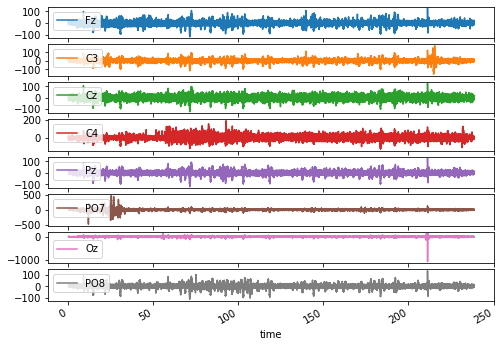

In [335]:
plot_cols = ['Fz', 'C3', 'Cz', 'C4', 'Pz', 'PO7', 'Oz', 'PO8']
plot_features = df[plot_cols]
plot_features.index = df['time']
_ = plot_features.plot(subplots=True)

In [336]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
time,291778.0,120.716831,67.412529,0.000000,62.361000,120.716000,179.072000,238.632000
Fz,291778.0,-0.001685,13.419061,-117.682975,-6.098344,0.068371,6.275778,127.348626
C3,291778.0,-0.001825,13.927864,-159.438944,-6.155217,-0.006770,6.288104,178.640766
Cz,291778.0,-0.002134,15.376726,-124.094141,-8.045659,-0.042217,8.217821,127.757969
C4,291778.0,-0.004958,16.004969,-124.137889,-6.447631,-0.060000,6.333814,188.632985
Pz,291778.0,0.001686,12.552840,-122.219024,-5.677201,0.035191,5.826569,128.330938
PO7,291778.0,-0.007803,19.880037,-473.793418,-6.291383,0.067974,6.429786,464.175084
Oz,291778.0,0.000461,13.951241,-1084.562049,-5.293582,0.077569,5.478731,156.877883
PO8,291778.0,0.004276,12.073303,-112.602972,-4.744451,0.062178,4.838496,133.117984
trigger,291778.0,0.038557,0.270290,0.000000,0.000000,0.000000,0.000000,2.000000


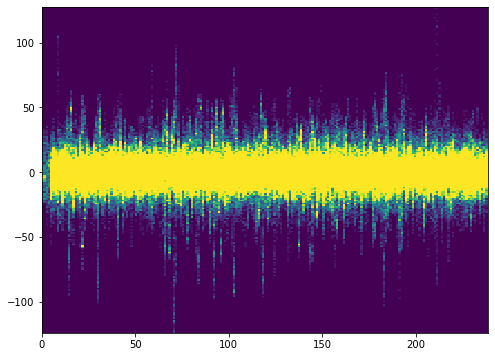

In [337]:
_ = plt.hist2d(df['time'], df['Cz'], bins=(200,200), vmax=20)

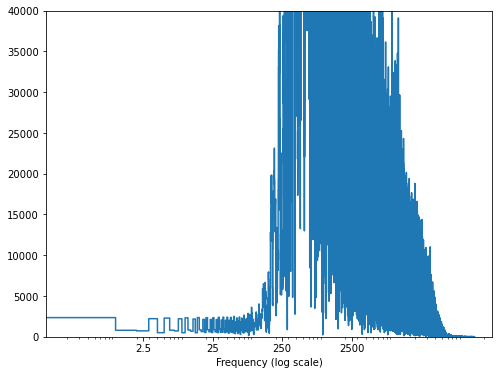

In [338]:
fft = tf.signal.rfft(df['Cz'])
f = np.arange(0,len(fft))

plt.step(f, np.abs(fft))
plt.xscale('log')
plt.ylim(0,40000)
plt.xlim([0.1, max(plt.xlim())])
plt.xticks([2.5, 25, 250, 2500], labels=['2.5', '25', '250', '2500'])
_ = plt.xlabel('Frequency (log scale)')

In [365]:
fs = 250
nyquist = fs / 2
low_cutoff = 15
high_cutoff = 0.2
b, a = signal.butter(5, low_cutoff, btype="lowpass", fs=fs)
bh, ah = signal.butter(5, high_cutoff, btype="highpass", fs=fs)

In [367]:
feature_cols = ['Fz', 'C3', 'Cz', 'C4', 'Pz', 'PO7', 'Oz', 'PO8']
mldf = df[feature_cols]

column_indices = {name: i for i, name in enumerate(mldf.columns)}
for channel in column_indices:
    channel_low = signal.filtfilt(b, a, mldf[channel])
    channel_low = np.transpose(np.array(channel_low))
    channel_high = signal.filtfilt(bh, ah, channel_low)
    channel_high = np.transpose(np.array(channel_high))
    mldf[channel] = channel_high

n = len(mldf)
train_df = mldf[0:int(n*0.7)]
val_df = mldf[int(n*0.7):int(n*0.9)]
test_df = mldf[int(n*0.9):]

num_features = mldf.shape[1]

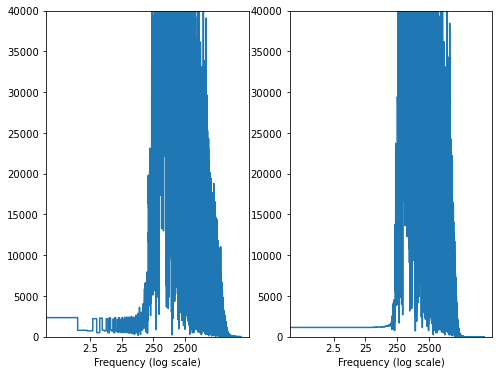

In [373]:
plt.subplot(1,2,1)
fft = tf.signal.rfft(df['Cz'])
f = np.arange(0,len(fft))

plt.step(f, np.abs(fft))
plt.xscale('log')
plt.ylim(0,40000)
plt.xlim([0.1, max(plt.xlim())])
plt.xticks([2.5, 25, 250, 2500], labels=['2.5', '25', '250', '2500'])
_ = plt.xlabel('Frequency (log scale)')


plt.subplot(1, 2, 2)
fft = tf.signal.rfft(mldf['Cz'])
f = np.arange(0,len(fft))

plt.step(f, np.abs(fft))
plt.xscale('log')
plt.ylim(0,40000)
plt.xlim([0.1, max(plt.xlim())])
plt.xticks([2.5, 25, 250, 2500], labels=['10ms', '100ms', '0.5', '2500'])
_ = plt.xlabel('Frequency (log scale)')

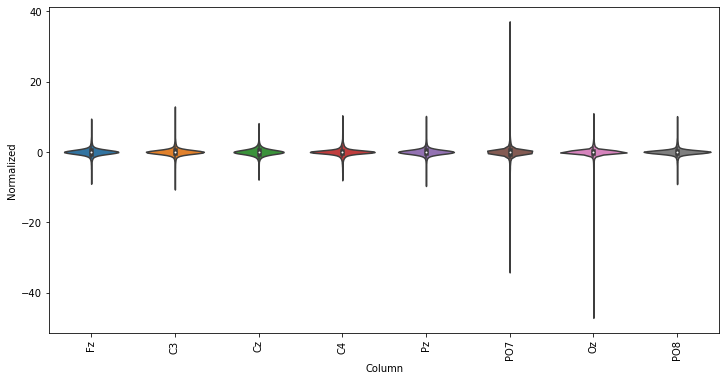

In [374]:
train_mean = train_df.mean()
train_std = train_df.std()

train_df = (train_df - train_mean) / train_std
val_df = (val_df - train_mean) / train_std
test_df = (test_df - train_mean) / train_std

df_std = (mldf - train_mean) / train_std
df_std = df_std.melt(var_name='Column', value_name='Normalized')
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='Normalized', data=df_std)
_ = ax.set_xticklabels(mldf.keys(), rotation=90)

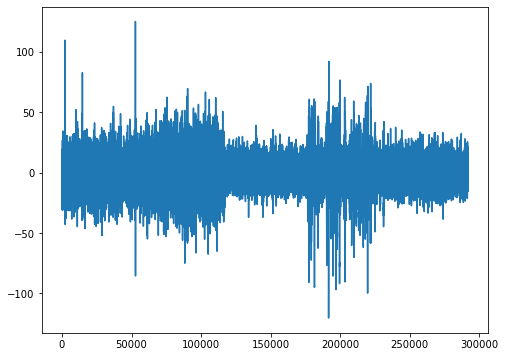

In [389]:
mne.io.read_raw_kit("../data/S1.mat")


Extracting SQD Parameters from ../data/S1.mat...
Creating Raw.info structure...


IndexError: index 0 is out of bounds for axis 0 with size 0